### Objective: To analyze the hydrophobicity scale scan data
I started investigating the effects of different scales. A paper *Comparison of hydrophobicity scales for predicting biophysical properties of antibodies* by Waibl et al. Frontiers in Molecular Biosciences 2022.* investigated the performance of different scales on predicting HIC. 


##### Import modules

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path

from developability.utils import ls, extract_sequence_from_pdb, plot_correlogram

pd.set_option('display.max_columns', 500)
pd.set_option('display.max_rows', 500)

%matplotlib inline
%reload_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = 'retina'

##### Load some data 

In [2]:
base_path = Path("/Users/ChristopherRivera/Documents/DataResults")
data_path = base_path /"TherapeuticAntibodies"

file_name = data_path/'hydrophobicity_scales_scan_results_12-01-2023.csv'
results_df = pd.read_csv(file_name)
results_df = results_df.set_index(['antibody'])

invitro_df = pd.read_csv(data_path/'invitro_measurments_from_tushar_2023.csv')
invitro_df = invitro_df.set_index('Name')

#### Merge the two dataframes to get the invitro measurements. 

In [3]:
results_df = results_df.merge(invitro_df, left_index=True, right_index=True)
results_df.head()

,HCDR1_HYDRO_pos,HCDR1_HYDRO_neg,HCDR1_HYDRO_net,HCDR2_HYDRO_pos,HCDR2_HYDRO_neg,HCDR2_HYDRO_net,HCDR3_HYDRO_pos,HCDR3_HYDRO_neg,HCDR3_HYDRO_net,HFR1_HYDRO_pos,HFR1_HYDRO_neg,HFR1_HYDRO_net,HFR2_HYDRO_pos,HFR2_HYDRO_neg,HFR2_HYDRO_net,HFR3_HYDRO_pos,HFR3_HYDRO_neg,HFR3_HYDRO_net,HFR4_HYDRO_pos,HFR4_HYDRO_neg,HFR4_HYDRO_net,LCDR1_HYDRO_pos,LCDR1_HYDRO_neg,LCDR1_HYDRO_net,LCDR2_HYDRO_pos,LCDR2_HYDRO_neg,LCDR2_HYDRO_net,LCDR3_HYDRO_pos,LCDR3_HYDRO_neg,LCDR3_HYDRO_net,LFR1_HYDRO_pos,LFR1_HYDRO_neg,LFR1_HYDRO_net,LFR2_HYDRO_pos,LFR2_HYDRO_neg,LFR2_HYDRO_net,LFR3_HYDRO_pos,LFR3_HYDRO_neg,LFR3_HYDRO_net,LFR4_HYDRO_pos,LFR4_HYDRO_neg,LFR4_HYDRO_net,HCDR_HYDRO_pos,HCDR_HYDRO_neg,HCDR_HYDRO_net,LCDR_HYDRO_pos,LCDR_HYDRO_neg,LCDR_HYDRO_net,HFR_HYDRO_pos,HFR_HYDRO_neg,HFR_HYDRO_net,LFR_HYDRO_pos,LFR_HYDRO_neg,LFR_HYDRO_net,HC_HYDRO_pos,HC_HYDRO_neg,HC_HYDRO_net,LC_HYDRO_pos,LC_HYDRO_neg,LC_HYDRO_net,TOTAL_CDR_HYDRO_pos,TOTAL_CDR_HYDRO_neg,TOTAL_CDR_HYDRO_net,TOTAL_FR_HYDRO_pos,TOTAL_FR_HYDRO_neg,TOTAL_FR_HYDRO_net,TOTAL_HYDRO_pos,TOTAL_HYDRO_neg,TOTAL_HYDRO_net,scale,weight,radius,Approved - 2022,Clinical.Status - 2017,Status.Change,Updated.Status,Tm(Negated),AS,SGAC(Negated),HIC,SMAC,PSR,ACSINS,CIC,CSI,FcRn.Rel.RT.3,ELISA,BVP,DNP,Fe.FVIII.2,Fe.C3.2,Fe.LysM.2,Heme.FVIII.2,Heme.C3.2,Heme.LysM.2,Heme.2,FA.2,Hep.RT.3,Flag.Tm(Negated),Flag.AS,Flag.SGAC(Negated),Flag.HIC,Flag.SMAC,Flag.PSR,Flag.ACSINS,Flag.CIC,Flag.CSI,Flag.FcRn.Rel.RT.3,Flag.ELISA,Flag.BVP,Flag.DNP,Flag.Fe.FVIII.2,Flag.Fe.C3.2,Flag.Fe.LysM.2,Flag.Heme.FVIII.2,Flag.Heme.C3.2,Flag.Heme.LysM.2,Flag.Heme.2,Flag.FA.2,Flag.Hep.RT.3,Cluster 3,Cluster 7,Cluster 6,Cluster 3+6+7
antibody,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,
abituzumab,2.281214,-1.649267,0.631948,8.534951,-32.326078,-23.791127,6.147798,-8.449018,-2.301219,15.618782,-34.510065,-18.891282,2.016692,-17.369957,-15.353264,10.179899,-34.389234,-24.209335,4.317373,-7.898236,-3.580863,3.965297,-16.844247,-12.878950,4.060361,-9.250666,-5.190305,2.289119,-9.767079,-7.477960,15.341437,-22.520495,-7.179059,3.874388,-22.590289,-18.715901,8.690540,-33.016594,-24.326054,9.245238,-16.602675,-7.357437,16.963963,-42.424362,-25.460398,10.314777,-35.861992,-25.547215,32.132747,-94.167492,-62.034745,37.151603,-94.730053,-57.578450,49.096710,-136.591853,-87.495143,47.466381,-130.592045,-83.125665,27.278741,-78.286354,-51.007613,69.284350,-188.897545,-119.613195,96.563091,-267.183899,-170.620808,Kyte_Doolittle,uniform,0.5,NaN,Phase 2,Regressed,Terminated,-75.5,0.06,-900.0,9.23,8.73,0.17,1.46,8.62,0.0,0.32,1.14,2.72,1.2,3.96,2.73,6.12,3.36,5.28,5.51,2.75,5.92,0.6,0,1,0,1,1,1,1,1,0,1.0,1,1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2,4,2,3
abituzumab,2.138805,-1.621197,0.517607,7.815791,-31.636621,-23.820830,5.146113,-8.114782,-2.968669,12.998490,-35.230704,-22.232214,1.778046,-17.299249,-15.521203,8.109661,-34.270023,-26.160363,3.100487,-7.676528,-4.576041,3.406054,-16.980080,-13.574026,3.914232,-9.083593,-5.169360,2.046581,-9.321749,-7.275168,13.085108,-21.928027,-8.842919,3.134771,-22.327578,-19.192807,7.674998,-32.910233,-25.235234,8.511510,-16.060108,-7.548598,15.100708,-41.372600,-26.271892,9.366867,-35.385422,-26.018554,25.986684,-94.476505,-68.489821,32.406388,-93.225946,-60.819558,41.087392,-135.849105,-94.761713,41.773255,-128.611368,-86.838113,24.467575,-76.758022,-52.290447,58.393072,-187.702451,-129.309379,82.860647,-264.460473,-181.599826,Kyte_Doolittle,uniform,1.0,NaN,Phase 2,Regressed,Terminated,-75.5,0.06,-900.0,9.23,8.73,0.17,1.46,8.62,0.0,0.32,1.14,2.72,1.2,3.96,2.73,6.12,3.36,5.28,5.51,2.75,5.92,0.6,0,1,0,1,1,1,1,1,0,1.0,1,1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2,4,2,3
abituzumab,1.734590,-0.210675,1.523914,3.667817,-8.477376,-4.809559,3.016407,-2.709743,0.306664,6.863056,-8.489358,-1.626302,1.996363,-4.097232,-2.100869,3.097553,-8.481819,-5.384266,2.846308,-1.047954,1.798354,1.613658,-5.055566,-3.441908,1.390609,-1.760119,-0.369510,2.3423

#### get subset of cols 

In [4]:
pos_cols = [col for col in results_df.columns if 'pos' in col]
neg_cols = [col for col in results_df.columns if 'neg' in col ]
net_cols = [col for col in results_df.columns if 'net' in col ]


In [5]:
def plot_subset_correlogram(df, subset_cols,scale,radius = 0.5, title=None, figsize=(15,15)):

    if radius:
        subset_df = (df.query("scale ==@scale and radius == @radius")
                 [subset_cols]
                 .copy())
    else: 
        subset_df = (df.query("scale ==@scale")
                 [subset_cols]
                 .copy())

    corr = subset_df.corr()
    corr = corr.round(2)
    
    if title is None: 
        title = f'Scale: {scale}, Radius: {radius}'
    ax = plot_correlogram(corr, title=title, annot = True, compute_corr = False, vmin = -1, vmax = 1, figsize=figsize)
    return ax 

In [6]:
scales = results_df['scale'].unique()
scales

array(['Kyte_Doolittle', 'Eisenberg', 'Rose', 'BaMe', 'BlMo', 'Ei',
       'KyDo', 'Me', 'Ro', 'WiWh', 'Ja', 'Mi'], dtype=object)

<Axes: title={'center': 'Scale: WiWh, Radius: 0.5'}>

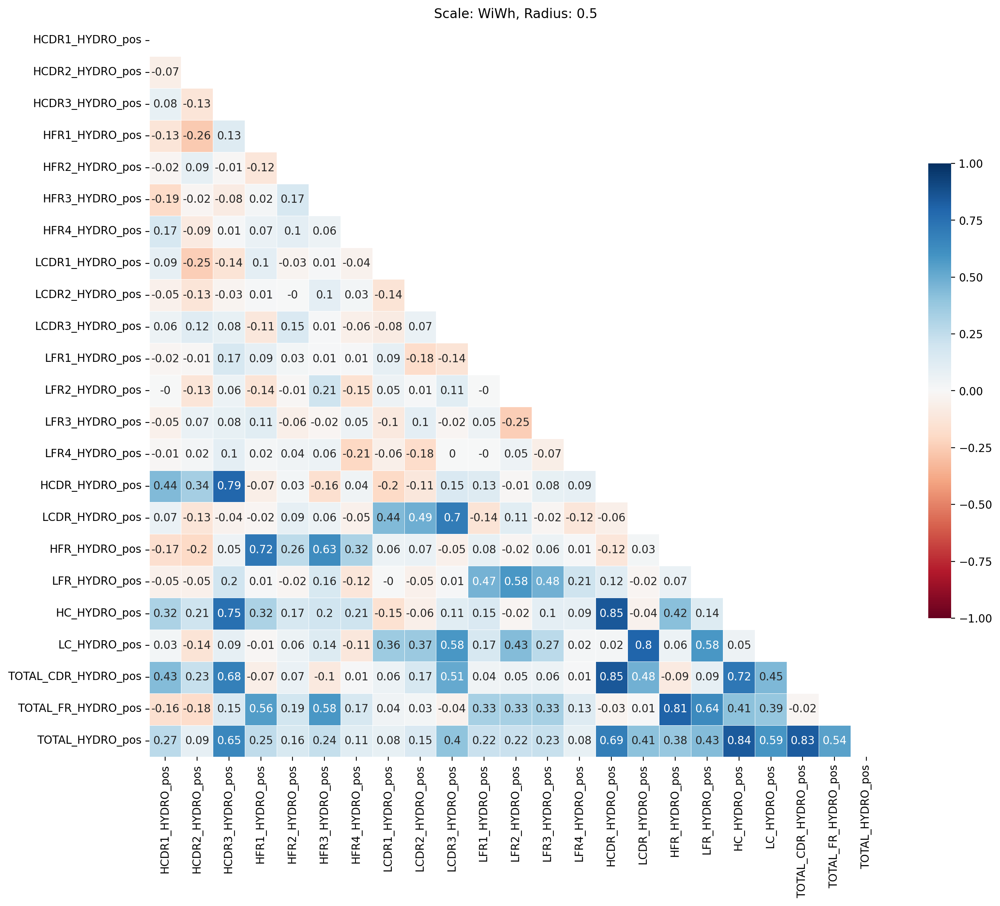

In [7]:
plot_subset_correlogram(results_df, pos_cols ,scale='WiWh',radius = 0.5)

<Axes: title={'center': 'Scale: WiWh, Radius: 1'}>

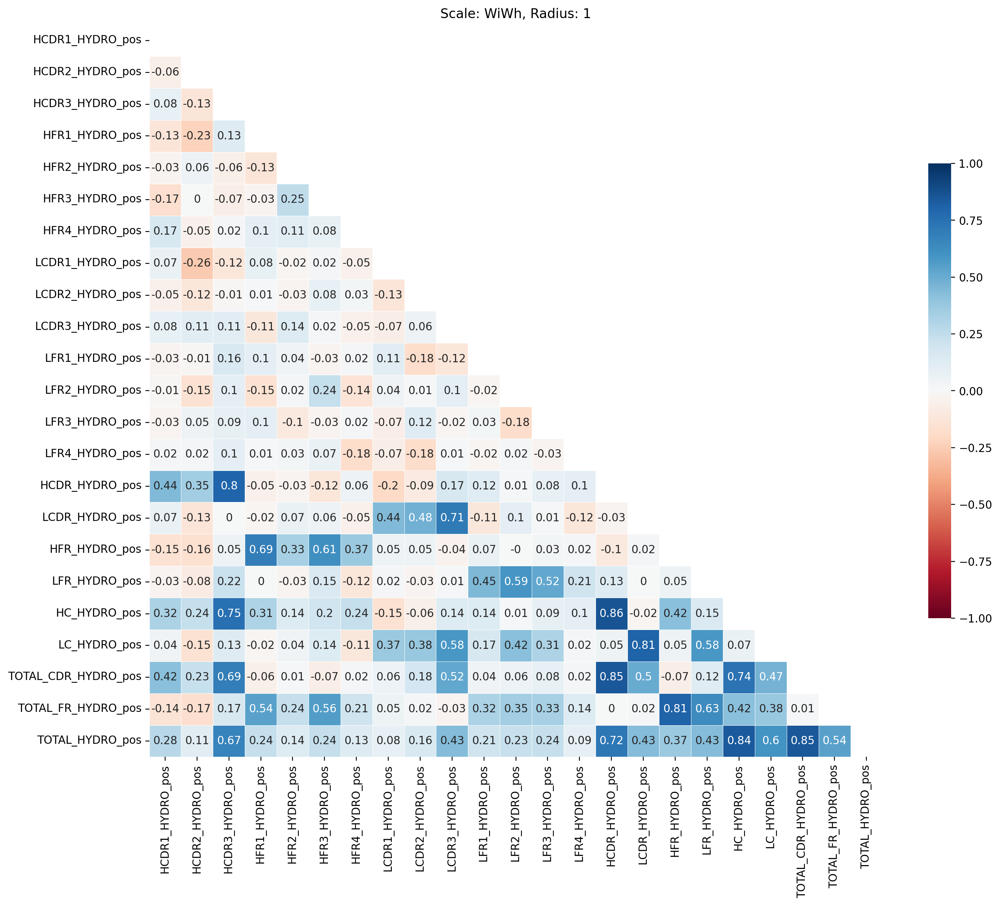

In [8]:
plot_subset_correlogram(results_df, pos_cols ,scale='WiWh',radius = 1)

### Loook at the correlation between the different scales and HIC

In [9]:
def  calculate_corr_with_hic( df, scale='WiWh', radius=1, subset_cols=pos_cols, digits = 5):
    if radius: 
        df = df.query("scale ==@scale and radius == @radius").copy()
    else: 
        df = df.query("scale ==@scale").copy()
    hic = df['HIC']
    subset_df = df[subset_cols]
    
    corr = subset_df.corrwith(hic)
    return corr.round(digits)


def calculate_corr_with_hic_for_multiple_scales(df, radius=0.5, subset_cols = pos_cols, digits = 5): 
    scales = df['scale'].unique()
    scale_corrs = []
    for scale in scales: 

        scale_corrs.append(calculate_corr_with_hic(df, scale ,radius, subset_cols, digits = digits))
        
    df = pd.concat(scale_corrs, axis = 1)
    df.columns = scales
    return df

def plot_corr_hic_barplot( df, scale='WiWh', radius=1, subset_cols=pos_cols, ax = None, figsize=(10,10)):
    corr = calculate_corr_with_hic(df, scale=scale, radius=radius, subset_cols=subset_cols)
    corr = corr.sort_values()
    if not ax: 
        figsize = figsize
    else:
        figsize = None
    ax = corr.plot.barh( ax = ax, figsize=figsize)
    ax.set_title(f'Scale: {scale}, Radius: {radius}')
    sns.despine()
    return ax


def plot_hic_corr_heatmap(df, radius=0.5,subset_cols = pos_cols,  ax=None, digits = 2,  figsize = (20,10),sign = 'pos',  title = None):
    
    
    if not ax: 
        fig, ax = plt.subplots(1,1,figsize=figsize)
    
    if not title: 
        title = f'Correlation of hydrophobicity scores versus HIC for multiple scales\nsubset: {sign}, radius:{radius}'

    df = calculate_corr_with_hic_for_multiple_scales(df, radius, subset_cols, digits)
    ax = sns.heatmap(df.T, cmap = 'RdBu', annot =True, ax = ax, linewidths=0.5)
    ax.set(title=title)
    return ax



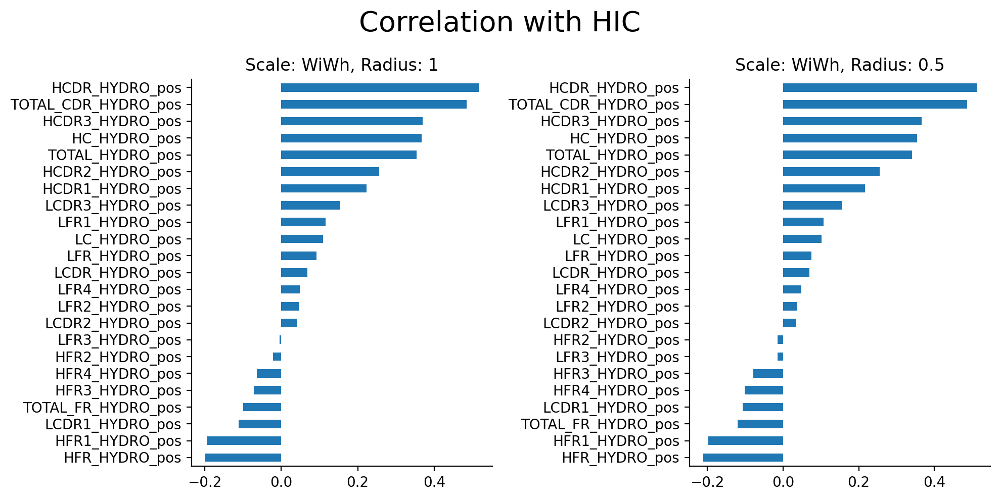

In [10]:
fig, axes = plt.subplots(1,2, figsize=(10,5))

ax = plot_corr_hic_barplot(results_df, scale='WiWh', radius=1, ax = axes[0])

plot_corr_hic_barplot(results_df, scale='WiWh', radius=0.5, ax = axes[1])
fig.suptitle('Correlation with HIC', fontsize=20)
plt.tight_layout()

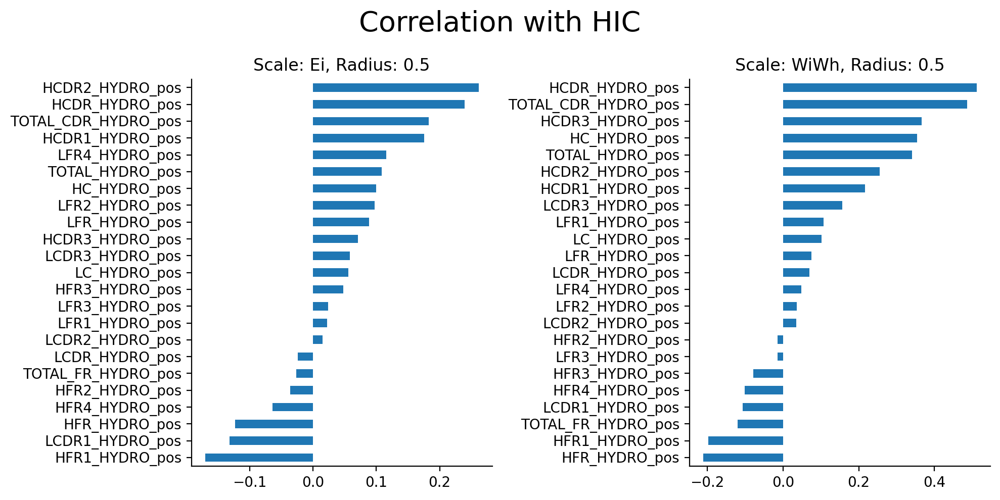

In [11]:
fig, axes = plt.subplots(1,2, figsize=(10,5))

ax = plot_corr_hic_barplot(results_df, scale='Ei', radius=0.5, ax = axes[0])

plot_corr_hic_barplot(results_df, scale='WiWh', radius=0.5, ax = axes[1])
fig.suptitle('Correlation with HIC', fontsize=20)
plt.tight_layout()

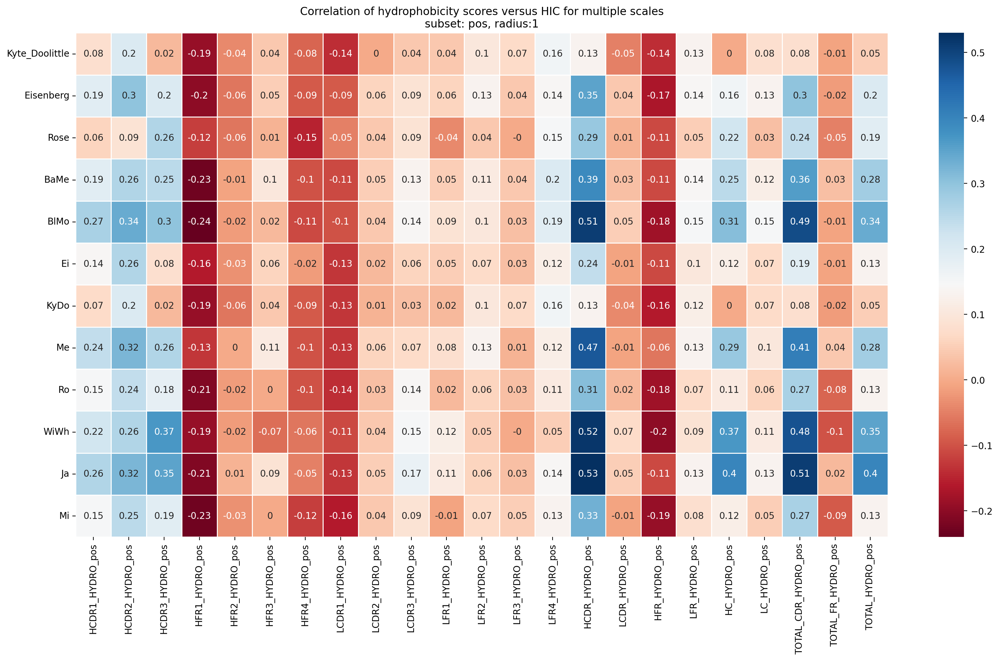

In [12]:
plot_hic_corr_heatmap(results_df, radius=1,subset_cols = pos_cols,  ax=None, digits = 2);

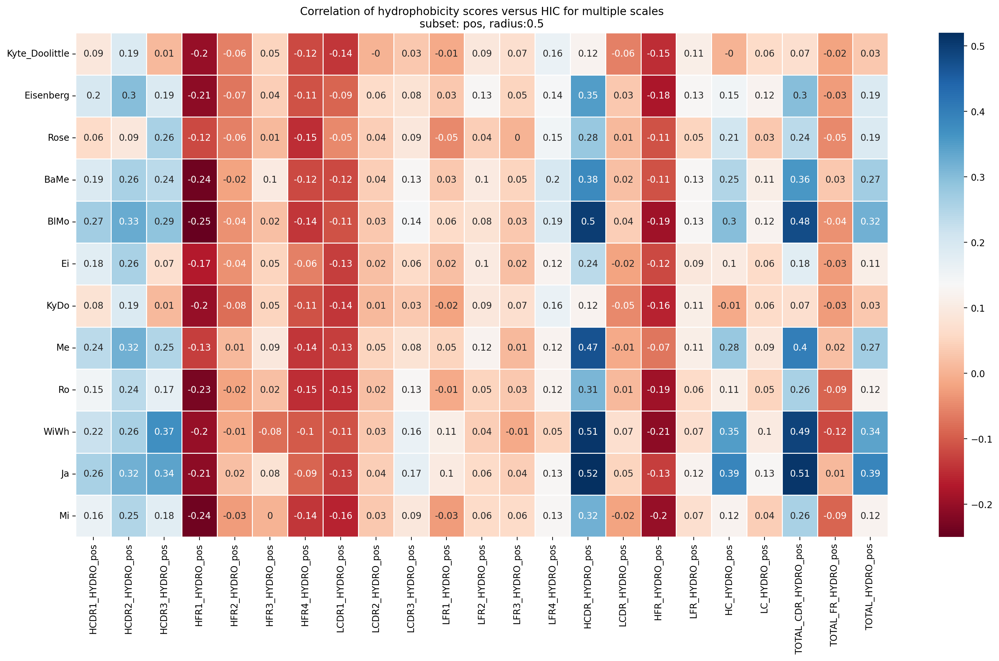

In [13]:
plot_hic_corr_heatmap(results_df, radius=0.5,subset_cols = pos_cols,  ax=None, digits = 2);

/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


<Axes: title={'center': 'Correlation of hydrophobicity scores versus HIC for multiple scales\nsubset: neg, radius:0.5'}>

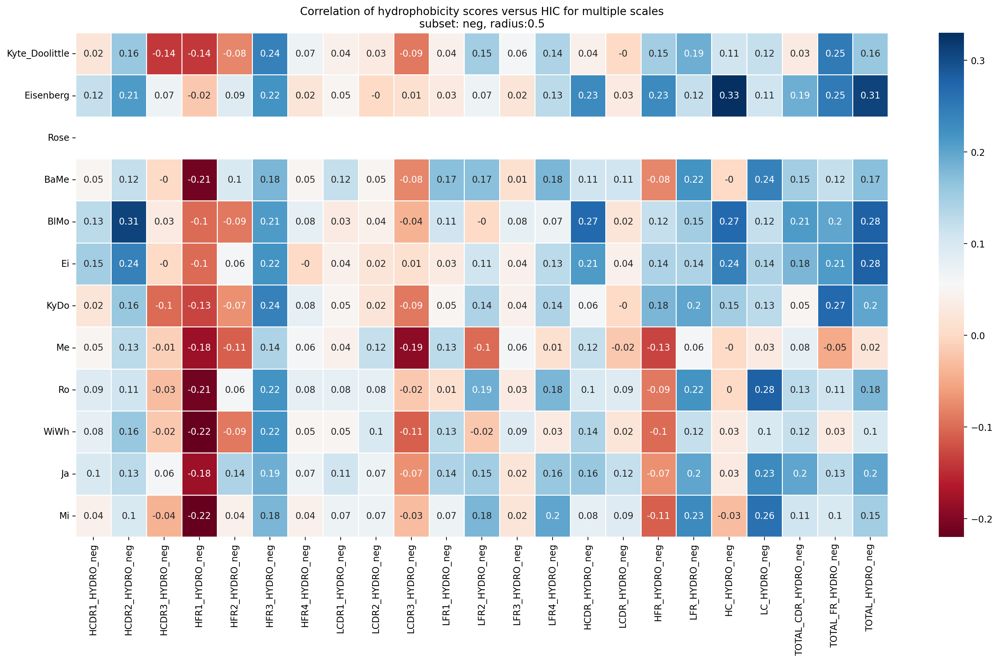

In [14]:
plot_hic_corr_heatmap(results_df, radius=0.5,subset_cols = neg_cols,  ax=None, digits = 2, sign = 'neg')

<Axes: title={'center': 'Correlation of hydrophobicity scores versus HIC for multiple scales\nsubset: net, radius:0.5'}>

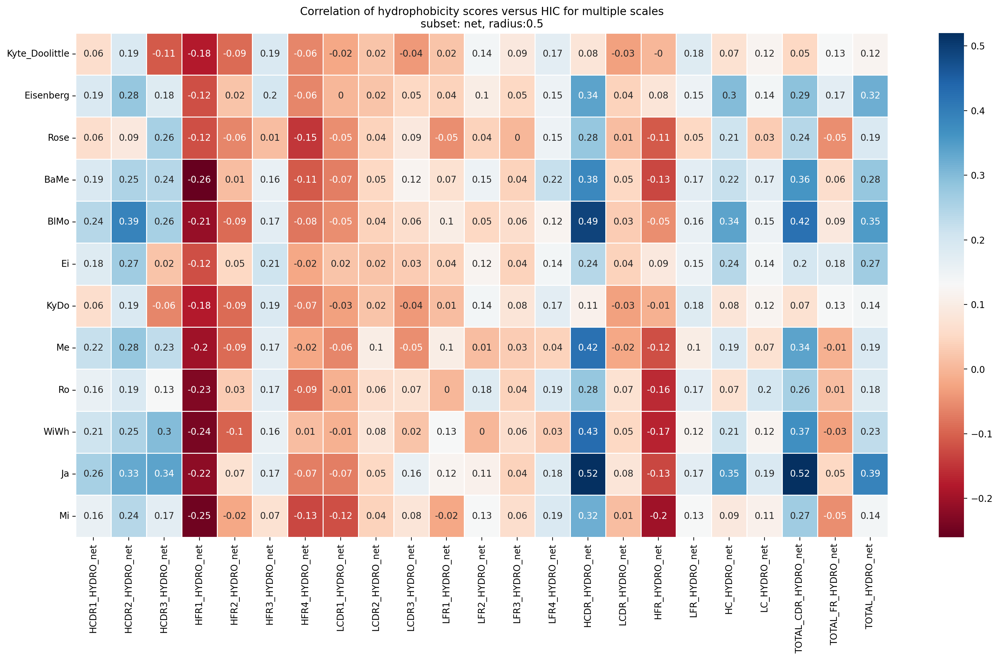

In [15]:
plot_hic_corr_heatmap(results_df, radius=0.5,subset_cols = net_cols,  ax=None, digits = 2, sign = 'net')

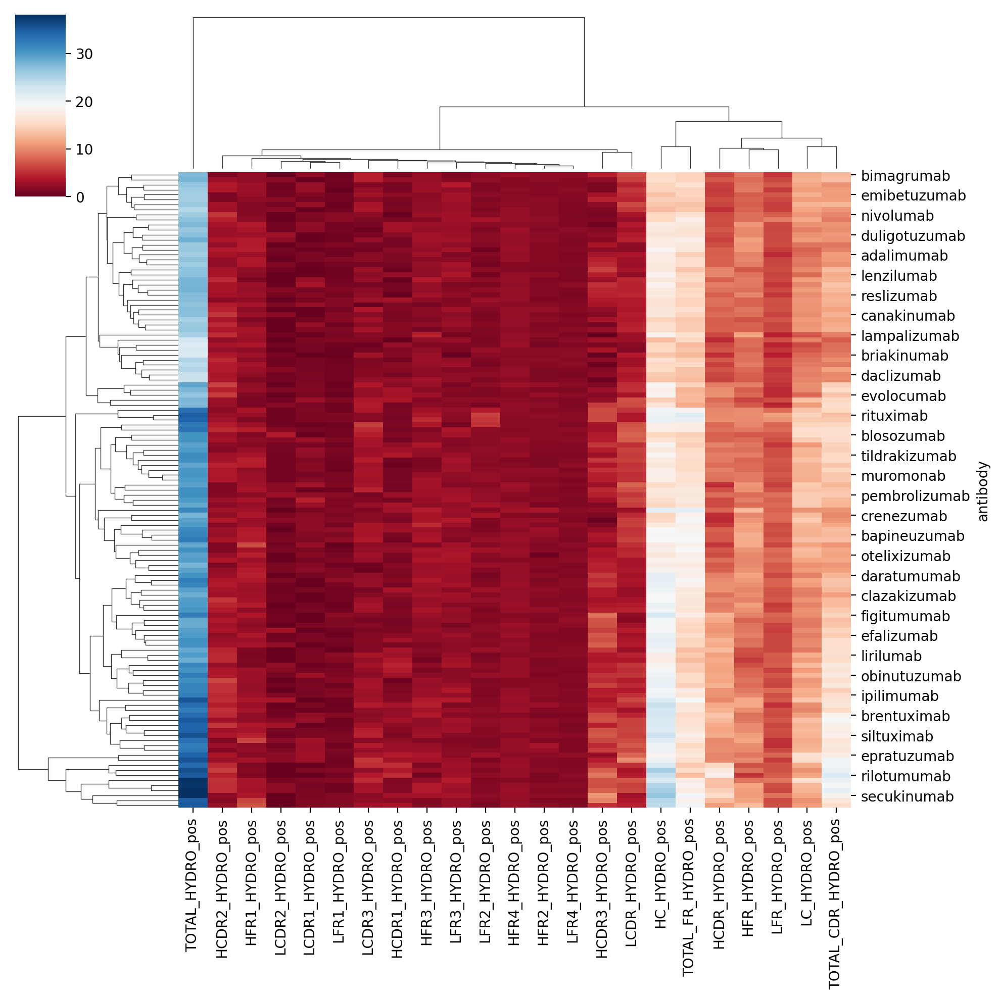

In [16]:
sns.clustermap(results_df.query('radius==1 and scale=="WiWh"')[pos_cols],cmap = 'RdBu')

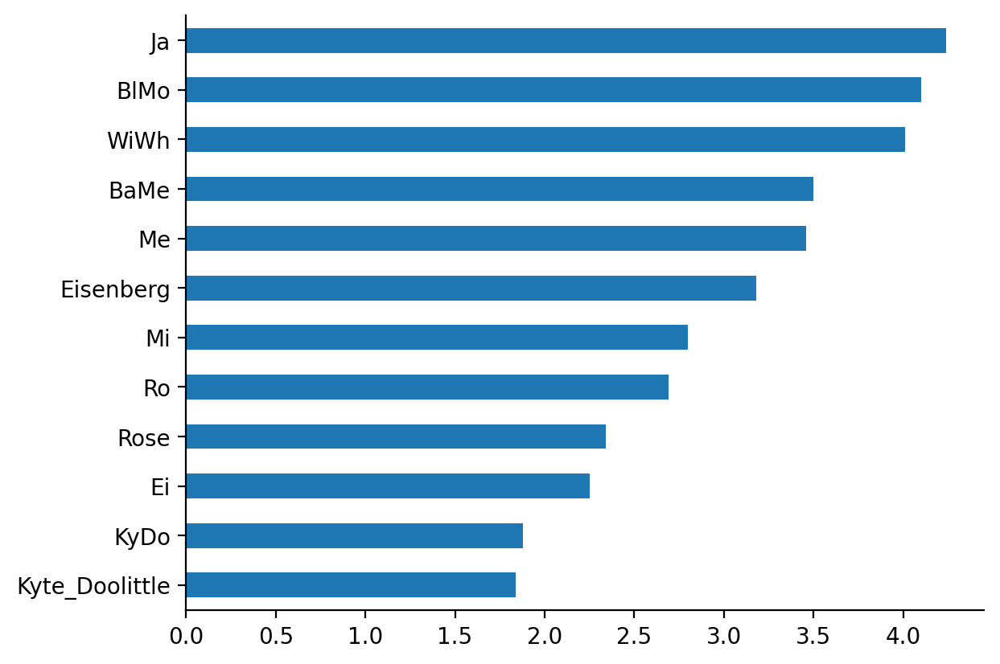

In [17]:

hic_df = calculate_corr_with_hic_for_multiple_scales(results_df, radius=0.5, subset_cols = pos_cols, digits = 2).abs()
hic_df.sum().sort_values().plot(kind = 'barh')
sns.despine()

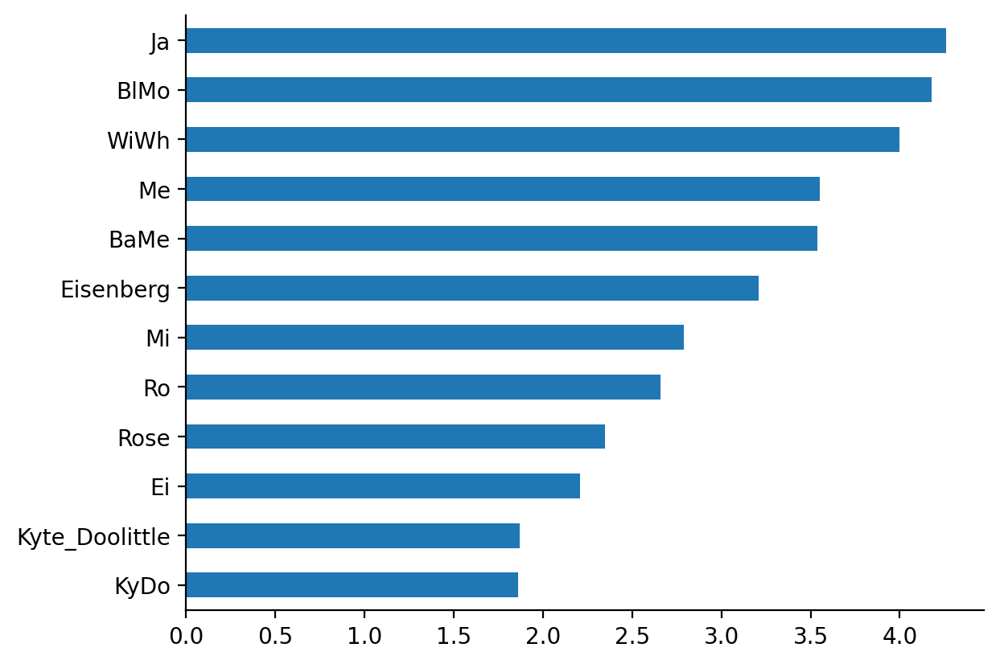

In [18]:

hic_df = calculate_corr_with_hic_for_multiple_scales(results_df, radius=1, subset_cols = pos_cols, digits = 2).abs()
hic_df.sum().sort_values().plot(kind = 'barh')
sns.despine()

### Plot the correlation of the hydrophobicity scores with the HIC values for JA. 

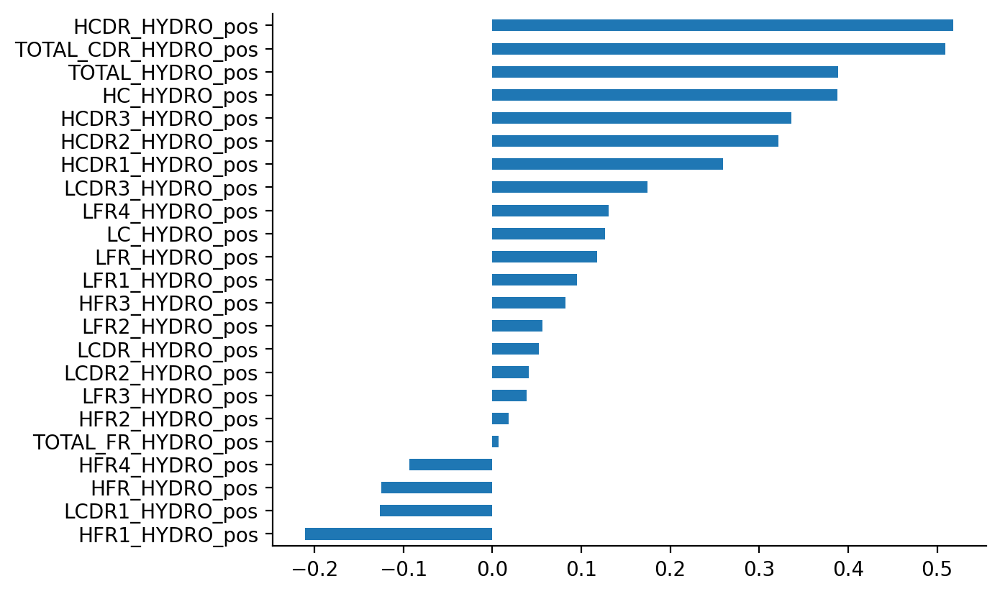

In [19]:
ja_df = results_df.query('scale == "Ja" and radius == 0.5')[pos_cols + ['HIC']]
ja_df.corrwith(ja_df['HIC']).sort_values().head(-1).plot(kind = 'barh')
sns.despine()

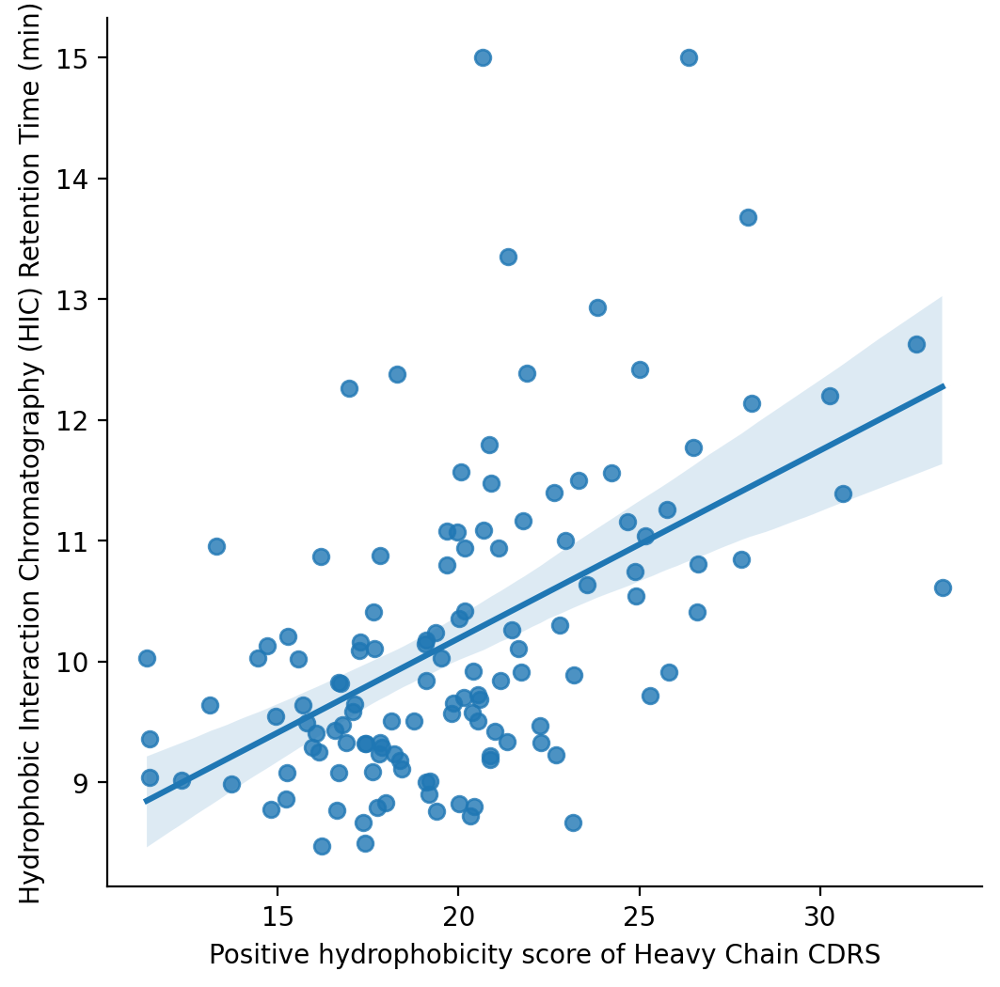

In [20]:
fig, ax = plt.subplots(1,1, figsize=(6,6))
ax = sns.regplot(y='HIC', x='HCDR_HYDRO_pos', data=ja_df, ax = ax)
ax.set(xlabel = 'Positive hydrophobicity score of Heavy Chain CDRS', ylabel = 'Hydrophobic Interaction Chromatography (HIC) Retention Time (min)')
sns.despine()

### Analyze the rsa hydrophobicity results. 

Here are comparing the hydrophobicity caclulated using relative surface area. 

In [21]:
fname = data_path/'rsa_hydrophobicity_descriptors_12-05-2023.csv'
rsa_df = pd.read_csv(fname).set_index('antibody')
rsa_df = rsa_df.merge(invitro_df, left_index=True, right_index=True)

rsa_df.head()

,HCDR1_HYDRO_pos,HCDR1_HYDRO_neg,HCDR1_HYDRO_net,HCDR2_HYDRO_pos,HCDR2_HYDRO_neg,HCDR2_HYDRO_net,HCDR3_HYDRO_pos,HCDR3_HYDRO_neg,HCDR3_HYDRO_net,HFR1_HYDRO_pos,HFR1_HYDRO_neg,HFR1_HYDRO_net,HFR2_HYDRO_pos,HFR2_HYDRO_neg,HFR2_HYDRO_net,HFR3_HYDRO_pos,HFR3_HYDRO_neg,HFR3_HYDRO_net,HFR4_HYDRO_pos,HFR4_HYDRO_neg,HFR4_HYDRO_net,LCDR1_HYDRO_pos,LCDR1_HYDRO_neg,LCDR1_HYDRO_net,LCDR2_HYDRO_pos,LCDR2_HYDRO_neg,LCDR2_HYDRO_net,LCDR3_HYDRO_pos,LCDR3_HYDRO_neg,LCDR3_HYDRO_net,LFR1_HYDRO_pos,LFR1_HYDRO_neg,LFR1_HYDRO_net,LFR2_HYDRO_pos,LFR2_HYDRO_neg,LFR2_HYDRO_net,LFR3_HYDRO_pos,LFR3_HYDRO_neg,LFR3_HYDRO_net,LFR4_HYDRO_pos,LFR4_HYDRO_neg,LFR4_HYDRO_net,HCDR_HYDRO_pos,HCDR_HYDRO_neg,HCDR_HYDRO_net,LCDR_HYDRO_pos,LCDR_HYDRO_neg,LCDR_HYDRO_net,HFR_HYDRO_pos,HFR_HYDRO_neg,HFR_HYDRO_net,LFR_HYDRO_pos,LFR_HYDRO_neg,LFR_HYDRO_net,HC_HYDRO_pos,HC_HYDRO_neg,HC_HYDRO_net,LC_HYDRO_pos,LC_HYDRO_neg,LC_HYDRO_net,TOTAL_CDR_HYDRO_pos,TOTAL_CDR_HYDRO_neg,TOTAL_CDR_HYDRO_net,TOTAL_FR_HYDRO_pos,TOTAL_FR_HYDRO_neg,TOTAL_FR_HYDRO_net,TOTAL_HYDRO_pos,TOTAL_HYDRO_neg,TOTAL_HYDRO_net,scale,Approved - 2022,Clinical.Status - 2017,Status.Change,Updated.Status,Tm(Negated),AS,SGAC(Negated),HIC,SMAC,PSR,ACSINS,CIC,CSI,FcRn.Rel.RT.3,ELISA,BVP,DNP,Fe.FVIII.2,Fe.C3.2,Fe.LysM.2,Heme.FVIII.2,Heme.C3.2,Heme.LysM.2,Heme.2,FA.2,Hep.RT.3,Flag.Tm(Negated),Flag.AS,Flag.SGAC(Negated),Flag.HIC,Flag.SMAC,Flag.PSR,Flag.ACSINS,Flag.CIC,Flag.CSI,Flag.FcRn.Rel.RT.3,Flag.ELISA,Flag.BVP,Flag.DNP,Flag.Fe.FVIII.2,Flag.Fe.C3.2,Flag.Fe.LysM.2,Flag.Heme.FVIII.2,Flag.Heme.C3.2,Flag.Heme.LysM.2,Flag.Heme.2,Flag.FA.2,Flag.Hep.RT.3,Cluster 3,Cluster 7,Cluster 6,Cluster 3+6+7
abituzumab,1.158171,-0.047080,1.111091,1.039075,-2.250825,-1.211749,0.707422,-0.344297,0.363125,0.812412,-6.252358,-5.439946,0.082419,-2.248504,-2.166085,0.332966,-1.890088,-1.557123,0.259710,-1.221950,-0.962239,0.464284,-2.115353,-1.651069,0.458893,-0.420685,0.038208,0.733716,-0.230965,0.502752,0.156295,-3.828973,-3.672678,0.196139,-1.579183,-1.383044,0.217692,-2.680152,-2.462461,0.235574,-1.966035,-1.730461,2.904668,-2.642202,0.262466,1.656893,-2.767003,-1.110110,1.487507,-11.612900,-10.125393,0.805699,-10.054343,-9.248644,4.392175,-14.255102,-9.862927,2.462592,-12.821345,-10.358753,4.561561,-5.409205,-0.847643,2.293206,-21.667242,-19.374036,6.854767,-27.076447,-20.221680,WiWh,NaN,Phase 2,Regressed,Terminated,-75.5,0.06,-900.0,9.23,8.73,0.17,1.46,8.62,0.0,0.32,1.14,2.72,1.2,3.96,2.73,6.12,3.36,5.28,5.51,2.75,5.92,0.6,0,1,0,1,1,1,1,1,0,1.0,1,1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2,4,2,3
abituzumab,0.975470,-0.506023,0.469447,2.750974,-11.665356,-8.914382,1.259148,-2.913764,-1.654616,5.481614,-15.888710,-10.407096,0.426022,-4.967094,-4.541073,1.362078,-9.695109,-8.333031,0.490923,-2.893653,-2.402730,0.175909,-7.067039,-6.891130,1.431419,-3.193340,-1.761921,1.087759,-1.590735,-0.502976,3.430211,-11.317834,-7.887624,0.496164,-6.732908,-6.236744,2.204364,-9.328255,-7.123890,1.765415,-7.134338,-5.368923,4.985592,-15.085143,-10.099551,2.695087,-11.851114,-9.156026,7.760637,-33.444566,-25.683930,7.896154,-34.513335,-26.617181,12.746228,-48.529709,-35.783481,10.591241,-46.364448,-35.773207,7.680679,-26.936257,-19.255577,15.656790,-67.957901,-52.301110,23.337469,-94.894157,-71.556688,Kyte_Doolittle,NaN,Phase 2,Regressed,Terminated,-75.5,0.06,-900.0,9.23,8.73,0.17,1.46,8.62,0.0,0.32,1.14,2.72,1.2,3.96,2.73,6.12,3.36,5.28,5.51,2.75,5.92,0.6,0,1,0,1,1,1,1,1,0,1.0,1,1,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,2,4,2,3
abituzumab,0.383220,-0.092095,0.291126,1.027320,-3.375997,-2.348677,0.480563,-0.755429,-0.274866,2.109592,-4.266399,-2.156807,0.169728,-1.315369,-1.145641,0.520821,-2.471036,-1.950215,0.184681,-0.645577,-0.460896,0.073233,-2.042776,-1.969543,0.534396,-0.843852,-0.309455,0.427334,-0.399708,0.027626,1.306651,-3.022753,-1.716101,0.205333,-1.888590,-1.683257,0.829025,-2.208864,-1.379838,0.663889,-2.172114,-1.508225,1.891104,-4.223521,-2.332417,1.034963,-3.286336,-2.251372,2.984823,-8.698381,-5.713558,3.004898,-9.292320,-6.287

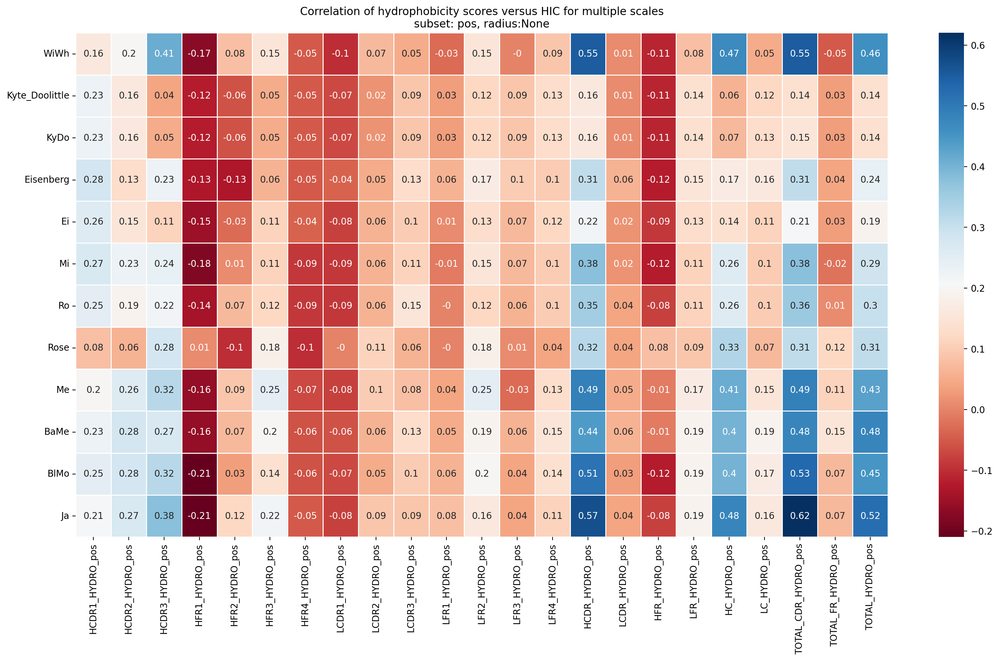

In [22]:
plot_hic_corr_heatmap(rsa_df, radius=None,subset_cols = pos_cols,  ax=None, digits = 2);

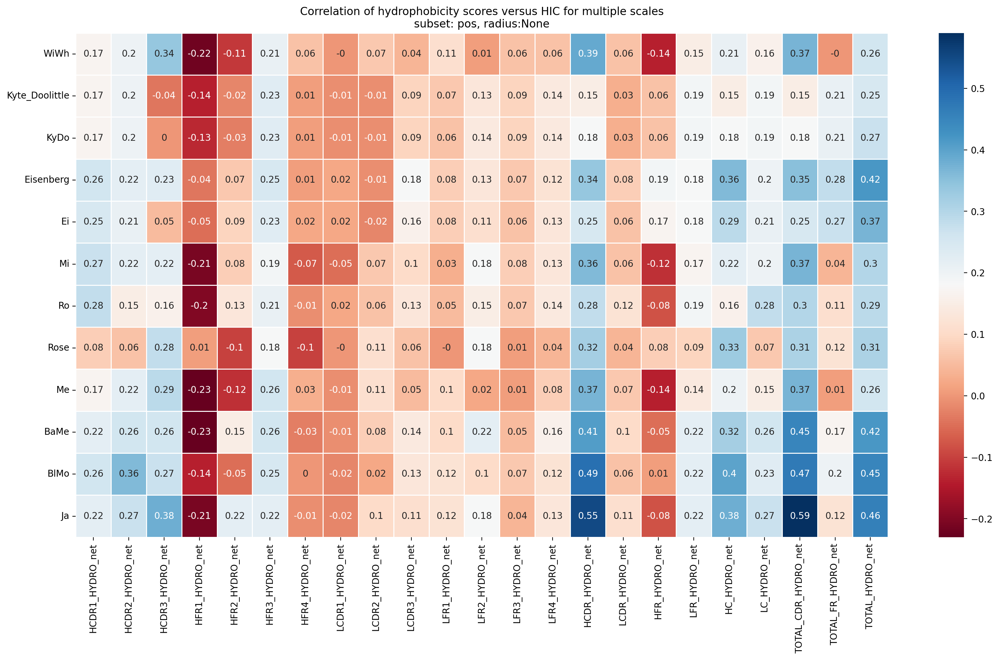

In [23]:
plot_hic_corr_heatmap(rsa_df, radius=None,subset_cols = net_cols,  ax=None, digits = 2);

<Axes: title={'center': 'Scale: Ja, Radius: None'}>

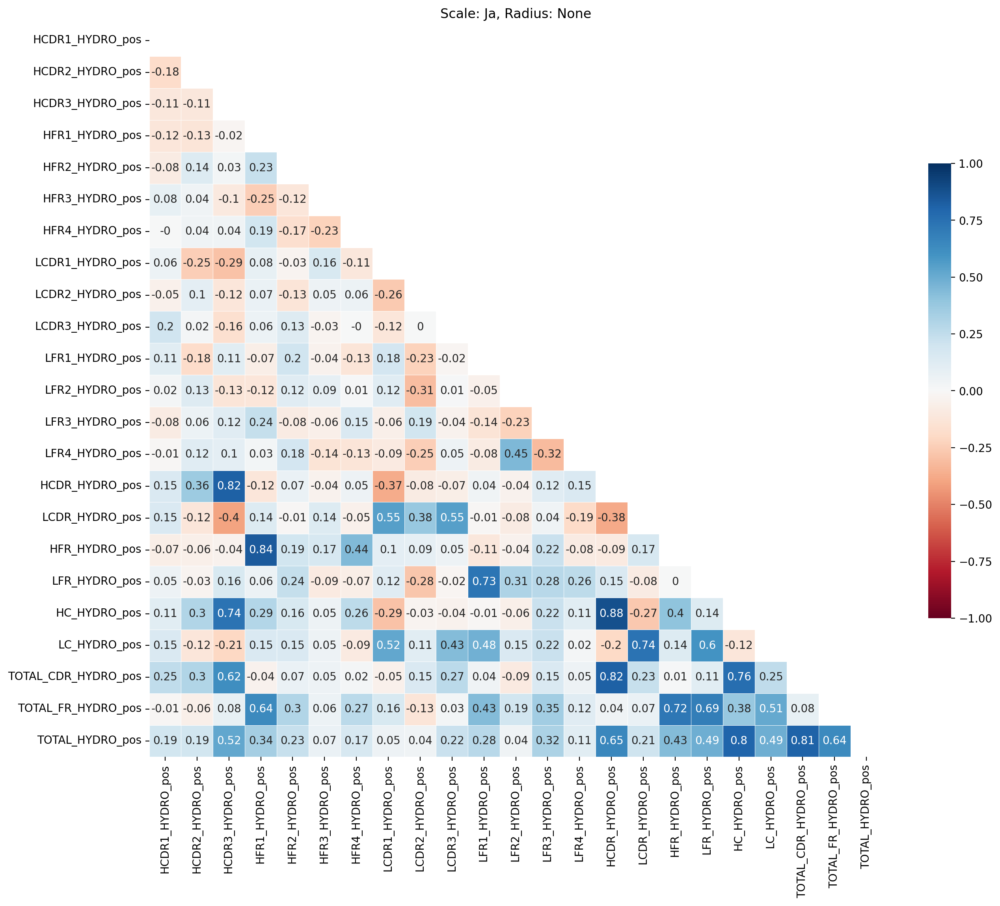

In [24]:
plot_subset_correlogram(rsa_df, subset_cols=pos_cols,scale='Ja',radius = None, title=None, figsize=(15,15))

#### Investigate one antibody for one scale between RSA and hydrophobicity scores

In [25]:
ab_paths = [d for d in ls(data_path/'AbodyBuilder2_predicted_renumbered_stuctures') if d.is_dir() and d.name.endswith('outputs')]
abs = [d.name.split('_')[0] for d in ab_paths]
abs.sort()

In [26]:
def plot_antibody(antibody, scale='Ja', radius = 0.5): 
    path = data_path/'AbodyBuilder2_predicted_renumbered_stuctures'/f'{antibody}_outputs'

    hydro = pd.read_csv(path/f'residue_hydrophobicity_scale_{scale}_weight_uniform_radius_{radius}.csv', index_col = 0)
    rsa_hydro = pd.read_csv(path/f'rsa_hydrophobicity_scale_{scale}.csv', index_col = 0  )
    

    fig, axes = plt.subplots(1,3, figsize=(15,5))
    ax = sns.lineplot(data=hydro.query('FV_chain=="H"'), x='FV_Residue_number', y= 'Hydrophobicity', label = 'Mesh Based Hydrophobicity', ax = axes[0])
    sns.lineplot(data=rsa_hydro.query('FV_chain=="H"'), x='FV_Residue_number', y= 'Hydrophobicity', label = 'RSA Based Hydrophobicity', ax = ax)
    ax.set(title = 'Heavy Chain', xlabel = 'Residue Number', ylabel = 'Hydrophobicity')

    ax = sns.lineplot(data=hydro.query('FV_chain=="L"'), x='FV_Residue_number', y= 'Hydrophobicity', label = 'Mesh Based Hydrophobicity', ax = axes[1])
    sns.lineplot(data=rsa_hydro.query('FV_chain=="L"'), x='FV_Residue_number', y= 'Hydrophobicity', label = 'RSA Based Hydrophobicity', ax = ax)
    ax.set(title = 'Light Chain', xlabel = 'Residue Number', ylabel = "")
    ax.legend([])


    ax =sns.regplot(x=hydro['Hydrophobicity'], y=rsa_hydro['Hydrophobicity'], ax = axes[2])
    ax.set(title = 'Hydrophobicity Comparison', xlabel = 'Mesh Based Hydrophobicity', ylabel = "RSA Based Hydrophobicity")
    
    sns.despine()
    fig.suptitle(f'Comparison of mesh and rsa Hydrophobicity of {antibody} using {scale} scale', fontsize=20)
    plt.tight_layout()
    return fig
                        


/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning

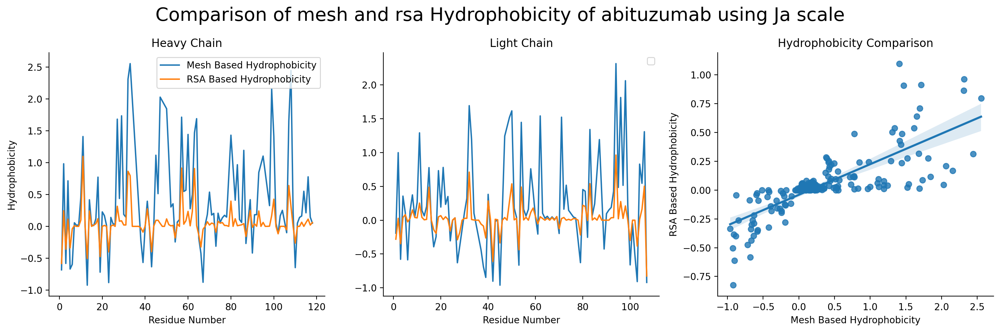

In [27]:
plot_antibody(abs[0], scale='Ja', radius = 0.5);

/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning

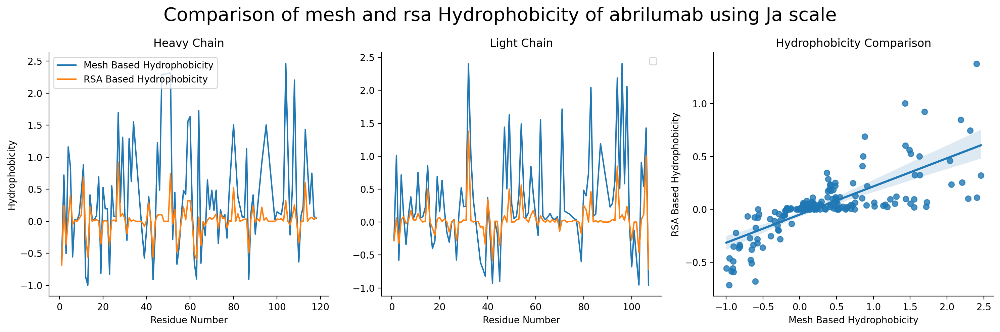

In [28]:
plot_antibody(abs[1], scale='Ja', radius = 0.5);

/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning

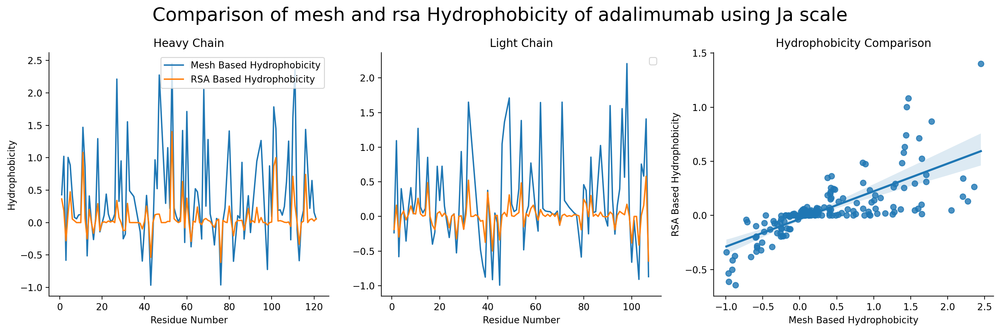

In [29]:
plot_antibody(abs[2], scale='Ja', radius = 0.5);

/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/seaborn/_oldcore.py:1498: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning

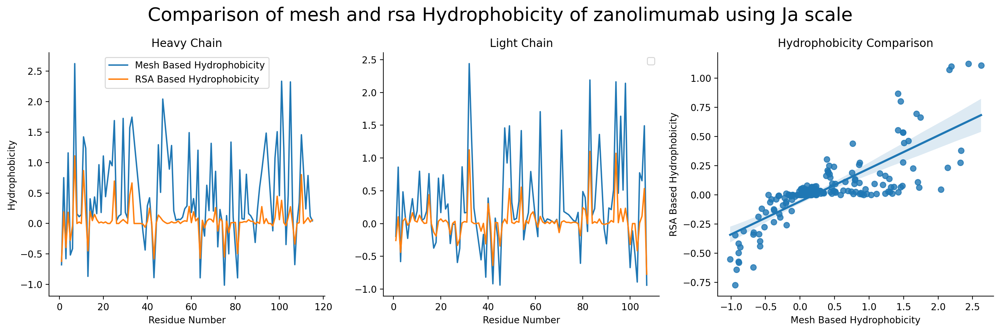

In [30]:
plot_antibody(abs[-1], scale='Ja', radius = 0.5);

## Analyzing data for sasa.

Below, I look at the data for sasa with out normalization. It does not appear to work super well. 

In [31]:
fname = data_path/'sasa_hydrophobicity_descriptors_12-11-2023.csv'
sasa_df = pd.read_csv(fname).set_index('antibody')
sasa_df = sasa_df.merge(invitro_df, left_index=True, right_index=True)

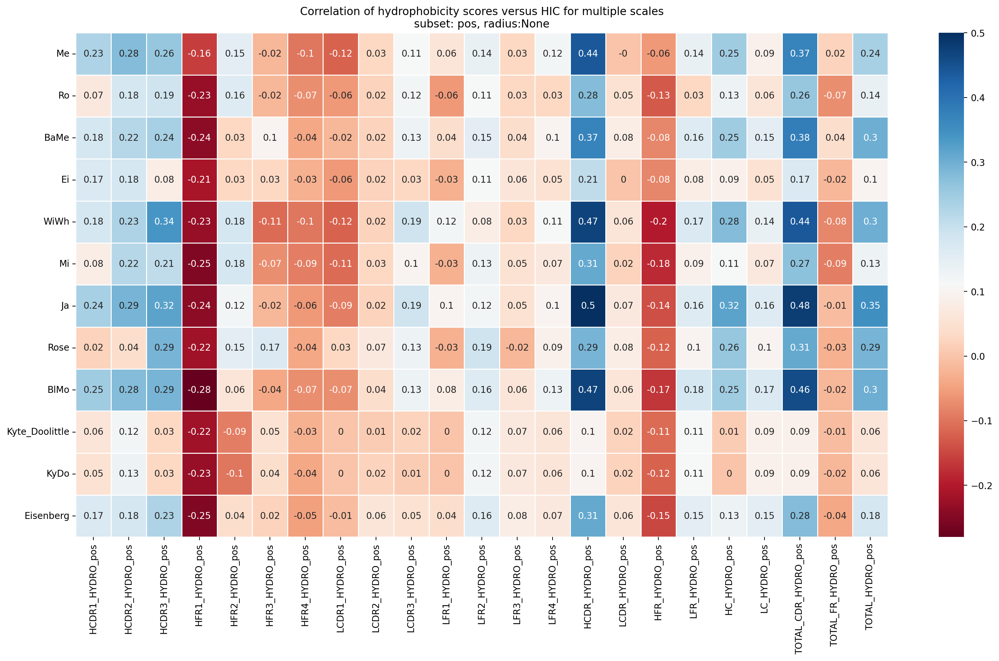

In [32]:
plot_hic_corr_heatmap(sasa_df, radius=None,subset_cols = pos_cols,  ax=None, digits = 2);

/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/numpy/lib/function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
/Users/ChristopherRivera/micromamba/envs/surface/lib/python3.11/site-packages/numpy/lib/function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


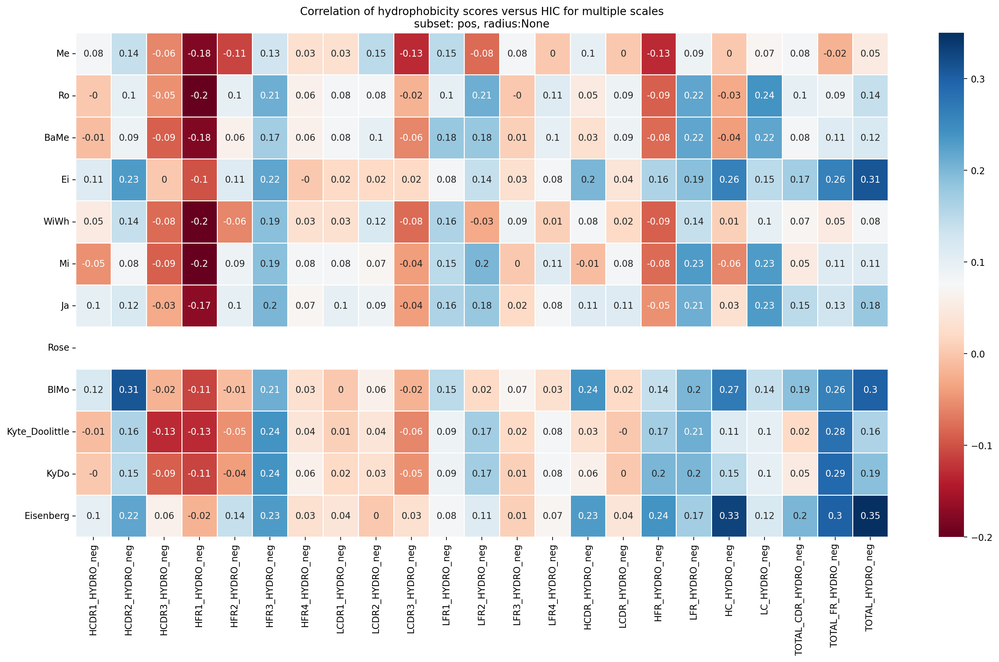

In [33]:
plot_hic_corr_heatmap(sasa_df, radius=None,subset_cols = neg_cols,  ax=None, digits = 2);

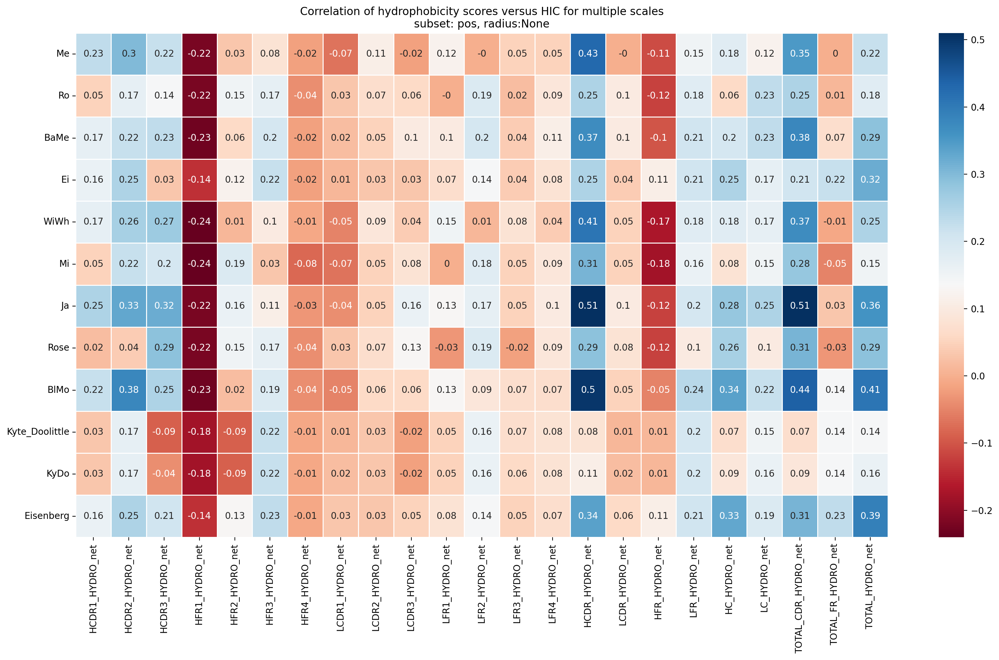

In [34]:
plot_hic_corr_heatmap(sasa_df, radius=None,subset_cols = net_cols,  ax=None, digits = 2);

 ### Make a plot to compare among the different methods. 

 I will compare the different methods using the "WiWh", "Jane" and "Black and Mould". 


In [35]:
select_scales = ["WiWh", "Ja", "BlMo" ]

def calc(df, radius, name, digits = 2, scales = select_scales, subset_cols = pos_cols):
    df = calculate_corr_with_hic_for_multiple_scales(df.query('scale in @scales'), radius=radius, subset_cols = subset_cols, digits = digits)
    df.index = name + '_'+df.index.str.split('_HYDRO_').str.get(0)
    return df

def calc_methods(subset_cols =pos_cols, scales = select_scales):

    combined_res = pd.concat([
        calc(results_df, radius=1, name='Mesh', scales = scales, subset_cols = subset_cols), 
        calc(rsa_df, radius=None, name='RSA', scales = scales, subset_cols = subset_cols), 
        calc(sasa_df, radius=None, name='SASA',scales = scales, subset_cols = subset_cols)
        ])
    
    return combined_res


combined_res = calc_methods()
combined_res.head()

,BlMo,WiWh,Ja
Mesh_HCDR1,0.27,0.22,0.26
Mesh_HCDR2,0.34,0.26,0.32
Mesh_HCDR3,0.30,0.37,0.35
Mesh_HFR1,-0.24,-0.19,-0.21
Mesh_HFR2,-0.02,-0.02,0.01


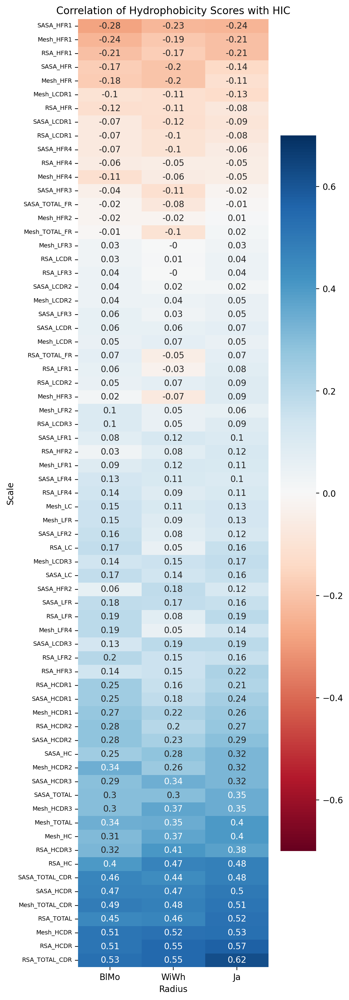

In [36]:
fig, axes = plt.subplots(1,1, figsize=(5,20))
order = combined_res.max(axis = 1).sort_values().index
sns.heatmap(combined_res.loc[order], annot=True, cmap = 'RdBu', vmin = -0.7, vmax = 0.7, ax = axes)
axes.set(title = 'Correlation of Hydrophobicity Scores with HIC', xlabel = 'Radius', ylabel = 'Scale')
axes.set_yticklabels(axes.get_yticklabels(), size = 7);

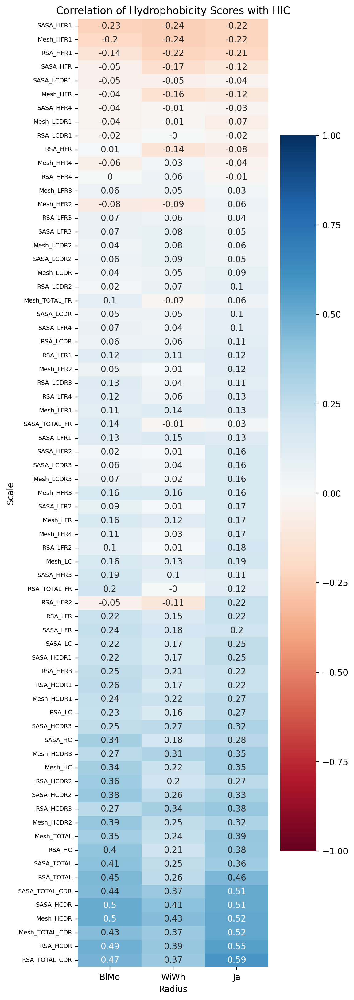

In [37]:
combined_net = calc_methods(subset_cols = net_cols)
fig, axes = plt.subplots(1,1, figsize=(5,20))
order = combined_net.max(axis = 1).sort_values().index
sns.heatmap(combined_net.loc[order], annot=True, cmap = 'RdBu', vmin = -1, vmax = 1, ax = axes)
axes.set(title = 'Correlation of Hydrophobicity Scores with HIC', xlabel = 'Radius', ylabel = 'Scale')
axes.set_yticklabels(axes.get_yticklabels(), size = 7);

### Conclusions: 


Thus far it seems that the best peformaing scale is the Jane scale, and the best performing method is the rsa. THe best descriptor is TOTAL_CDR_HYDRO_pos.

In [38]:
len(results_df.index.value_counts())

127